# Import

In [ ]:
import os
import pathlib
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, classification_report

import tensorflow as tf
import tensorflow_datasets as tfds

from keras.utils import image_dataset_from_directory
from keras.applications import MobileNetV2, MobileNetV3Large, MobileNetV3Small
from keras.applications.mobilenet_v2 import preprocess_input, decode_predictions
from keras import  optimizers, layers, regularizers
from keras.preprocessing import image
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, BatchNormalization, Dropout, Flatten
from keras.layers import CenterCrop, Rescaling, RandomRotation, RandomTranslation, RandomZoom, RandomFlip, RandomContrast, RandomBrightness, Normalization, Resizing
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras import backend as K

from PIL import Image
import glob

import concurrent.futures

import random

import re

try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    from google.colab import files
    from google.colab import drive

In [ ]:
if IN_COLAB:
    drive.mount('/content/drive/')
    dataset_dir = pathlib.Path("/content/drive/MyDrive/datasetCustom/")
else:
    dataset_dir = pathlib.Path("C:/Users/andre/Desktop/ProgettoSistemiDigitali/datasetCustom/")

ds_path = dataset_dir / "train_val"
test_path = dataset_dir / "test"

version = "_FULLDATASET_30_15"
crop_size = (480, 480)
img_size = (848, 480)

# Initial Set-up

## GPU Optimization

La funzione tf.config.experimental.set_memory_growth(gpu, True) serve a configurare TensorFlow in modo che allochi memoria sulla GPU in modo incrementale, anziché riservare tutta la memoria disponibile sulla GPU al momento dell'inizializzazione.

In [ ]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# Check CUDA support
if len(tf.config.list_physical_devices("GPU")) > 0:
    print("CUDA enabled.")
    print(len(tf.config.list_physical_devices("GPU")), "GPU(s) available.")
else:
    print("CUDA not enabled.")


CUDA not enabled.


## Initial preprocessing of data and Data augmentation - Training Pipeline

In [ ]:
augmentation_layers = tf.keras.Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomTranslation(0.1, 0.1),
    RandomZoom(0.2, 0.2),
])

def preprocess_and_augment(img, label):
    img = CenterCrop(height=crop_size[0], width=crop_size[1])(img)
    img = Resizing(224, 224)(img)    # Ridimensiona l'immagine a 224x224
    img = augmentation_layers(img)
    img /= 255           # Standardize to [0, 1] range
    img = (img * 2) - 1  # Standardize to [-1, 1] range
    #img = Normalization(mean=train_mean, variance=train_std**2)(img)
    return img, label

def preprocess(img, label):
    img = CenterCrop(height=crop_size[0], width=crop_size[1])(img)
    img = Resizing(224, 224)(img)    # Ridimensiona l'immagine a 224x224
    img /= 255           # Standardize to [0, 1] range
    img = (img * 2) - 1  # Standardize to [-1, 1] range
    #img = Normalization(mean=train_mean, variance=train_std**2)(img)
    return img, label

# Caricamento dei dataset
print("Training Dataset")
train_ds = image_dataset_from_directory(
    ds_path,
    labels='inferred',
    label_mode='categorical',
    batch_size=32,
    image_size=img_size,
    shuffle=True,
    validation_split=0.3,
    subset="training",
    seed=42
)
classes_train = train_ds.class_names
train_batches = train_ds.map(preprocess_and_augment, num_parallel_calls=tf.data.experimental.AUTOTUNE)
print()

print("Validation Dataset")
validation_ds = image_dataset_from_directory(
    ds_path,
    labels='inferred',
    label_mode='categorical',
    batch_size=32,
    image_size=img_size,
    validation_split=0.3,
    subset="validation",
    seed=42
)
classes_val = validation_ds.class_names
validation_batches = validation_ds.map(preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)
print()

print("Test Dataset")
test_ds = image_dataset_from_directory(
    test_path,
    labels='inferred',
    label_mode='categorical',
    batch_size=32,
    image_size=img_size
)
classes_test = test_ds.class_names
test_batches = test_ds.map(preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)
print()

# Prefetch per ottimizzare le prestazioni
train_batches = train_batches.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validation_batches = validation_batches.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_batches = test_batches.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

def split_classes_by_uppercase(class_list):
    split_classes = []
    for class_name in class_list:
        # Aggiungi uno spazio prima di ogni lettera maiuscola
        split_name = re.sub(r'([A-Z])', r' \1', class_name).strip()
        split_classes.append(split_name)
    return split_classes

# Uso della funzione per dividere le classi
classes_train = split_classes_by_uppercase(classes_train)
classes_val = split_classes_by_uppercase(classes_val)
classes_test = split_classes_by_uppercase(classes_test)

# Stampa dei risultati
print(len(classes_train), classes_train)
print(len(classes_val), classes_val)
print(len(classes_test), classes_test)

Training Dataset
Found 9360 files belonging to 26 classes.
Using 6552 files for training.

Validation Dataset
Found 9360 files belonging to 26 classes.
Using 2808 files for validation.

Test Dataset
Found 1040 files belonging to 26 classes.

26 ['Acqua Frizzante', 'Acqua Naturale', 'Coca Cola Classica', 'Coca Cola Zero', 'Cola Conad', 'Gocciole Classiche', 'Gocciole Cocco', 'Gocciole Conad', 'Gocciole Dark', 'Latte Azzurro', 'Latte Blu', 'Latte Rosso', 'Mela Gialla', 'Mela Rossa', 'Pane Bianco', 'Pane Cereali', 'Pane Grano Duro', 'Pane Integrale', 'Philadelphia Classico', 'Philadelphia Conad', 'Philadelphia Erbette', 'Philadelphia Salmone', 'Pink Lady', 'The Limone', 'The Pesca', 'The Verde']
26 ['Acqua Frizzante', 'Acqua Naturale', 'Coca Cola Classica', 'Coca Cola Zero', 'Cola Conad', 'Gocciole Classiche', 'Gocciole Cocco', 'Gocciole Conad', 'Gocciole Dark', 'Latte Azzurro', 'Latte Blu', 'Latte Rosso', 'Mela Gialla', 'Mela Rossa', 'Pane Bianco', 'Pane Cereali', 'Pane Grano Duro', 'Pan

## Sample images


Batch len:  32


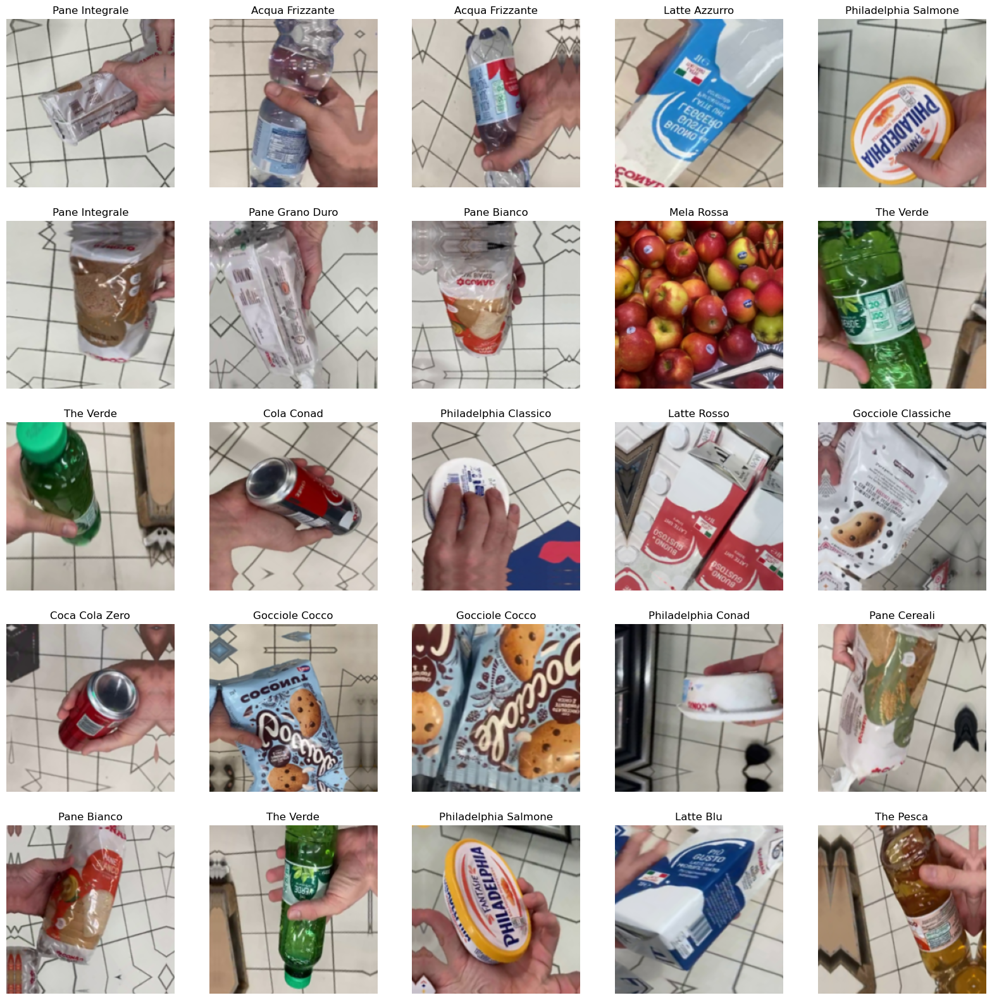

In [ ]:
# Visualizza 25 immagini con le loro etichette
plt.figure(figsize=(20, 20))
for j, (img, label) in enumerate(train_batches):
  print("Batch len: ", len(img))
  for i in range(min(25, len(img))):
    plt.subplot(5, 5, i + 1)
    # De-normalize images from training data
    img_np = img[i].numpy()  # Convert to numpy array
    #img_np = train_std * img_np + train_mean
    img_np = (img_np + 1) / 2  # Rescaling from [-1, 1] to [0, 1]
    plt.imshow(img_np)
    class_idx = np.argmax(label[i])
    class_name = classes_train[class_idx]
    plt.title(class_name)
    plt.axis("off")
  break
plt.show()

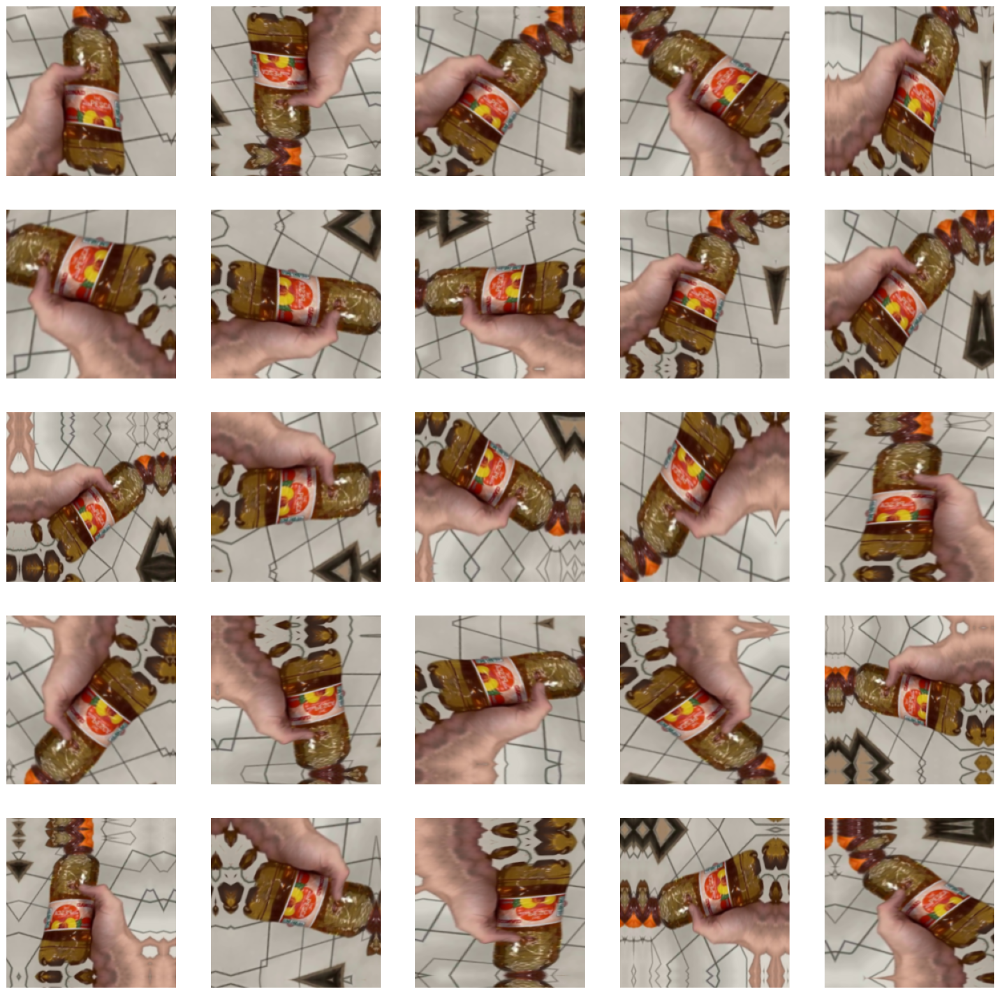

In [ ]:
# Visualizza 25 immagini con applicata Data Augmentation
plt.figure(figsize=(20, 20))
for j, (img, label) in enumerate(train_batches):
  for i in range(25):
    plt.subplot(5, 5, i + 1)
    # Apply Data Augmentation
    aug_img = augmentation_layers(img)
    # De-normalize images from training data
    img_np = aug_img[0].numpy()  # Convert to numpy array
    #img_np = train_std * img_np + train_mean
    img_np = (img_np + 1) / 2  # Rescaling from [-1, 1] to [0, 1]
    plt.imshow(img_np)
    plt.axis("off")
  break
plt.show()

# Fine-tune pre-defined network

## Download model and weights

In [ ]:
mobilenetv2_base_model = MobileNetV2(
    input_shape=(224, 224, 3),
    weights='imagenet',
    include_top=False
)

## Build custom model

In [ ]:
# Freeze the pretrained weights
mobilenetv2_base_model.trainable = False
# Rebuilding top of the model
x = mobilenetv2_base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(rate=0.5)(x)
outputs = Dense(len(classes_train), activation="softmax")(x)
# Compile
mobilenetv2_model = Model(inputs=mobilenetv2_base_model.input, outputs=outputs, name="MobileNetV2")
mobilenetv2_model.compile(
    loss="categorical_crossentropy",
    optimizer=optimizers.Adam(learning_rate=1e-3),
    metrics=["accuracy"]
)

In [ ]:
models = [mobilenetv2_model]

In [ ]:
for model in models:
  print(model.summary())

Model: "MobileNetV2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer_8[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 3,600,474 (13.73 MB)

 Trainable params: 1,340,442 (5.11 MB)

 Non-trainable params: 2,260,032 (8.62 MB)

None


## Fine-Train model

In [ ]:
epochs = 30  # @param {type: "slider", min:1, max:50}
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

models_hist = []
for model in models:
    hist = model.fit(train_batches, epochs=epochs, validation_data=validation_batches, callbacks=[early_stopping, reduce_lr])
    models_hist.append(hist)

Epoch 1/20
205/205 ━━━━━━━━━━━━━━━━━━━━ 167s 790ms/step - accuracy: 0.7035 - loss: 1.0399 - val_accuracy: 0.9370 - val_loss: 0.2014 - learning_rate: 0.0010
Epoch 2/20
205/205 ━━━━━━━━━━━━━━━━━━━━ 173s 837ms/step - accuracy: 0.9326 - loss: 0.2011 - val_accuracy: 0.9270 - val_loss: 0.2362 - learning_rate: 0.0010
Epoch 3/20
205/205 ━━━━━━━━━━━━━━━━━━━━ 183s 883ms/step - accuracy: 0.9538 - loss: 0.1352 - val_accuracy: 0.9416 - val_loss: 0.2143 - learning_rate: 0.0010
Epoch 4/20
205/205 ━━━━━━━━━━━━━━━━━━━━ 202s 980ms/step - accuracy: 0.9535 - loss: 0.1474 - val_accuracy: 0.9117 - val_loss: 0.2477 - learning_rate: 0.0010
Epoch 5/20
205/205 ━━━━━━━━━━━━━━━━━━━━ 238s 1s/step - accuracy: 0.9627 - loss: 0.1203 - val_accuracy: 0.9427 - val_loss: 0.1629 - learning_rate: 0.0010
Epoch 6/20
205/205 ━━━━━━━━━━━━━━━━━━━━ 202s 976ms/step - accuracy: 0.9591 - loss: 0.1100 - val_accuracy: 0.9487 - val_loss: 0.1595 - learning_rate: 0.0010
Epoch 7/20
205/205 ━━━━━━━━━━━━━━━━━━━━ 175s 847ms/step - accuracy:

### Plot Accuracy and Loss

Plot saved locally as model_plots_Train1_accuracy_FULLDATASET_20_10.png


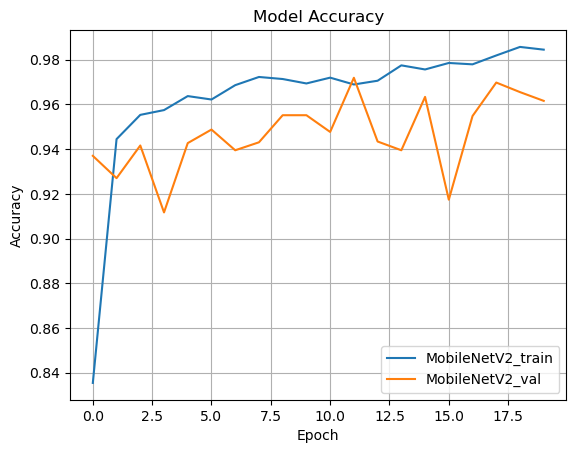

Plot saved locally as model_plots_Train1_loss_FULLDATASET_20_10.png


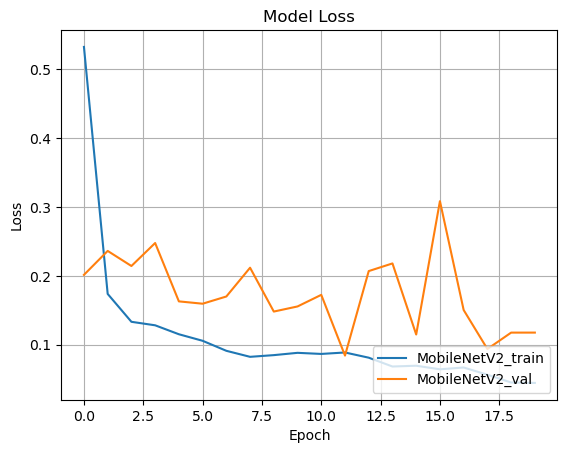

In [ ]:
def plot_accuracy(models_hist, models, save_path=None):
    legend_names = []
    for model_hist, model in zip(models_hist, models):
        plt.plot(model_hist.history["accuracy"])
        plt.plot(model_hist.history["val_accuracy"])
        legend_names.extend([f"{model.name}_train", f"{model.name}_val"])
    plt.title("Model Accuracy")
    plt.ylabel("Accuracy")
    plt.xlabel("Epoch")
    plt.legend(legend_names, loc="lower right")
    plt.grid(True)

    if save_path:
        plt.savefig(save_path)
        if IN_COLAB:
            files.download(save_path)
        else:
            print(f"Plot saved locally as {save_path}")
    plt.show()

def plot_loss(models_hist, models, save_path=None):
    legend_names = []
    for model_hist, model in zip(models_hist, models):
        plt.plot(model_hist.history["loss"])
        plt.plot(model_hist.history["val_loss"])
        legend_names.extend([f"{model.name}_train", f"{model.name}_val"])
    plt.title("Model Loss")
    plt.ylabel("Loss")
    plt.xlabel("Epoch")
    plt.legend(legend_names, loc="lower right")
    plt.grid(True)

    if save_path:
        plt.savefig(save_path)
        if IN_COLAB:
            files.download(save_path)
        else:
            print(f"Plot saved locally as {save_path}")
    plt.show()

save_path_acc = "model_plots_Train1_accuracy" + version + ".png"
plot_accuracy(models_hist, models, save_path_acc)
save_path_loss = "model_plots_Train1_loss" + version + ".png"
plot_loss(models_hist, models, save_path_loss)

### Save Model

In [ ]:
# Salva i modelli Keras in formato .keras
for model in models:
    model.save(f"{model.name}_Train1"+version+".keras")
    print(f"{model.name}_Train1"+version+" saved successfully.")

# Scarica i file .h5 se eseguito in Colab
if IN_COLAB:
    for model in models:
        files.download(f"{model.name}_Train1"+version+".keras")

MobileNetV2_Train1_FULLDATASET_20_10 saved successfully.


## Upload Model

In [ ]:
mobilenetv2_model = tf.keras.models.load_model("MobileNetV2" + '_Train1'+version+'.keras', compile=True)
print(f"{mobilenetv2_model.name} loaded successfully.")
models = [mobilenetv2_model]

MobileNetV2 loaded successfully.


## Unfreeze model

In [ ]:
def unfreeze_model(model, num_trainable_layers=20):
    for layer in model.layers[-num_trainable_layers:]:
      layer.trainable = True
    for layer in model.layers[:-num_trainable_layers]:
      layer.trainable = False

for model in models:
  unfreeze_model(model, num_trainable_layers=16)
  model.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.Adam(learning_rate=1e-5),
    metrics=['accuracy'],
  )
  print(model.name + " layers: ", len(model.layers))

MobileNetV2 layers:  159


## Train model

In [ ]:
epochs = 15  # @param {type: "slider", min:1, max:50}
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

models_hist = []
for model in models:
    hist = model.fit(train_batches, epochs=epochs, validation_data=validation_batches, callbacks=[early_stopping, reduce_lr])
    models_hist.append(hist)

Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 214s 999ms/step - accuracy: 0.9169 - loss: 0.2851 - val_accuracy: 0.9509 - val_loss: 0.1701 - learning_rate: 1.0000e-05
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 201s 971ms/step - accuracy: 0.9488 - loss: 0.1488 - val_accuracy: 0.9519 - val_loss: 0.1621 - learning_rate: 1.0000e-05
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 204s 987ms/step - accuracy: 0.9565 - loss: 0.1370 - val_accuracy: 0.9573 - val_loss: 0.1515 - learning_rate: 1.0000e-05
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 207s 1s/step - accuracy: 0.9579 - loss: 0.1177 - val_accuracy: 0.9640 - val_loss: 0.1297 - learning_rate: 1.0000e-05
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 187s 907ms/step - accuracy: 0.9712 - loss: 0.0827 - val_accuracy: 0.9662 - val_loss: 0.1198 - learning_rate: 1.0000e-05
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 289s 1s/step - accuracy: 0.9723 - loss: 0.0840 - val_accuracy: 0.9683 - val_loss: 0.1131 - learning_rate: 1.0000e-05
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 282s 1

### Plot Accuracy and Loss

Plot saved locally as model_plots_Train2_accuracy_FULLDATASET_20_10.png


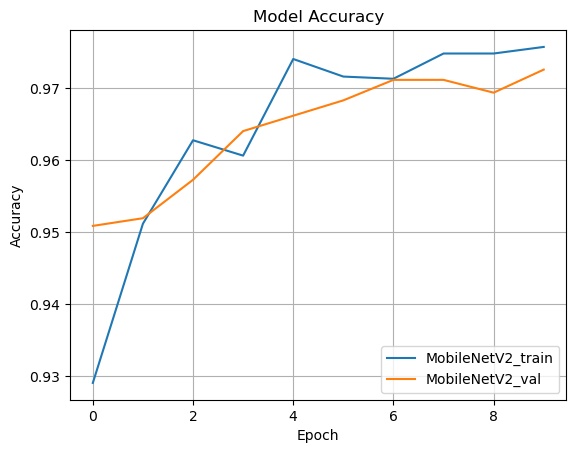

Plot saved locally as model_plots_Train2_loss_FULLDATASET_20_10.png


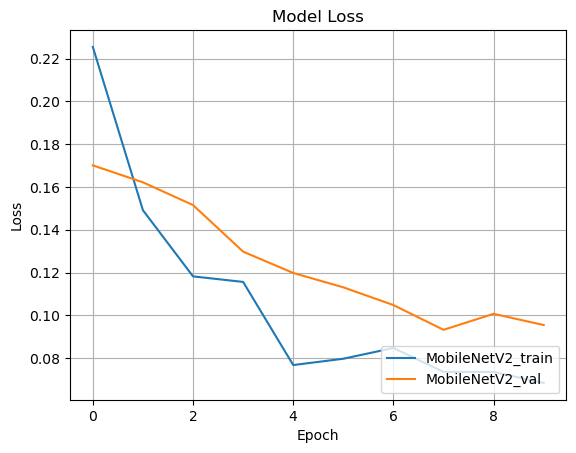

In [ ]:
def plot_accuracy(models_hist, models, save_path=None):
    legend_names = []
    for model_hist, model in zip(models_hist, models):
        plt.plot(model_hist.history["accuracy"])
        plt.plot(model_hist.history["val_accuracy"])
        legend_names.extend([f"{model.name}_train", f"{model.name}_val"])
    plt.title("Model Accuracy")
    plt.ylabel("Accuracy")
    plt.xlabel("Epoch")
    plt.legend(legend_names, loc="lower right")
    plt.grid(True)

    if save_path:
        plt.savefig(save_path)
        if IN_COLAB:
            files.download(save_path)
        else:
            print(f"Plot saved locally as {save_path}")
    plt.show()

def plot_loss(models_hist, models, save_path=None):
    legend_names = []
    for model_hist, model in zip(models_hist, models):
        plt.plot(model_hist.history["loss"])
        plt.plot(model_hist.history["val_loss"])
        legend_names.extend([f"{model.name}_train", f"{model.name}_val"])
    plt.title("Model Loss")
    plt.ylabel("Loss")
    plt.xlabel("Epoch")
    plt.legend(legend_names, loc="lower right")
    plt.grid(True)

    if save_path:
        plt.savefig(save_path)
        if IN_COLAB:
            files.download(save_path)
        else:
            print(f"Plot saved locally as {save_path}")
    plt.show()

save_path_acc = "model_plots_Train2_accuracy" + version + ".png"
plot_accuracy(models_hist, models, save_path_acc)
save_path_loss = "model_plots_Train2_loss" + version + ".png"
plot_loss(models_hist, models, save_path_loss)

### Save Model

In [ ]:
# Salva i modelli Keras in formato .keras
for model in models:
    model.save(f"{model.name}_Train2"+version+".keras")
    print(f"{model.name}_Train2"+version+" saved successfully.")

# Scarica i file .h5 se eseguito in Colab
if IN_COLAB:
    for model in models:
        files.download(f"{model.name}_Train2"+version+".keras")

MobileNetV2_Train2_FULLDATASET_20_10 saved successfully.


## Upload Model

In [ ]:
mobilenetv2_model = tf.keras.models.load_model("MobileNetV2" + '_Train2'+version+'.keras', compile=True)
print(f"{mobilenetv2_model.name} loaded successfully.")
models = [mobilenetv2_model]

MobileNetV2 loaded successfully.


## Confusion matrix, Precision, Recall, F1-Score


Numero totale di immagini in test_batches: 1040
33/33 ━━━━━━━━━━━━━━━━━━━━ 25s 633ms/step - accuracy: 0.9750 - loss: 0.0677
Test Loss MobileNetV2: 0.0674
Test Accuracy MobileNetV2: 0.9769
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 637ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 673ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 702ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/s

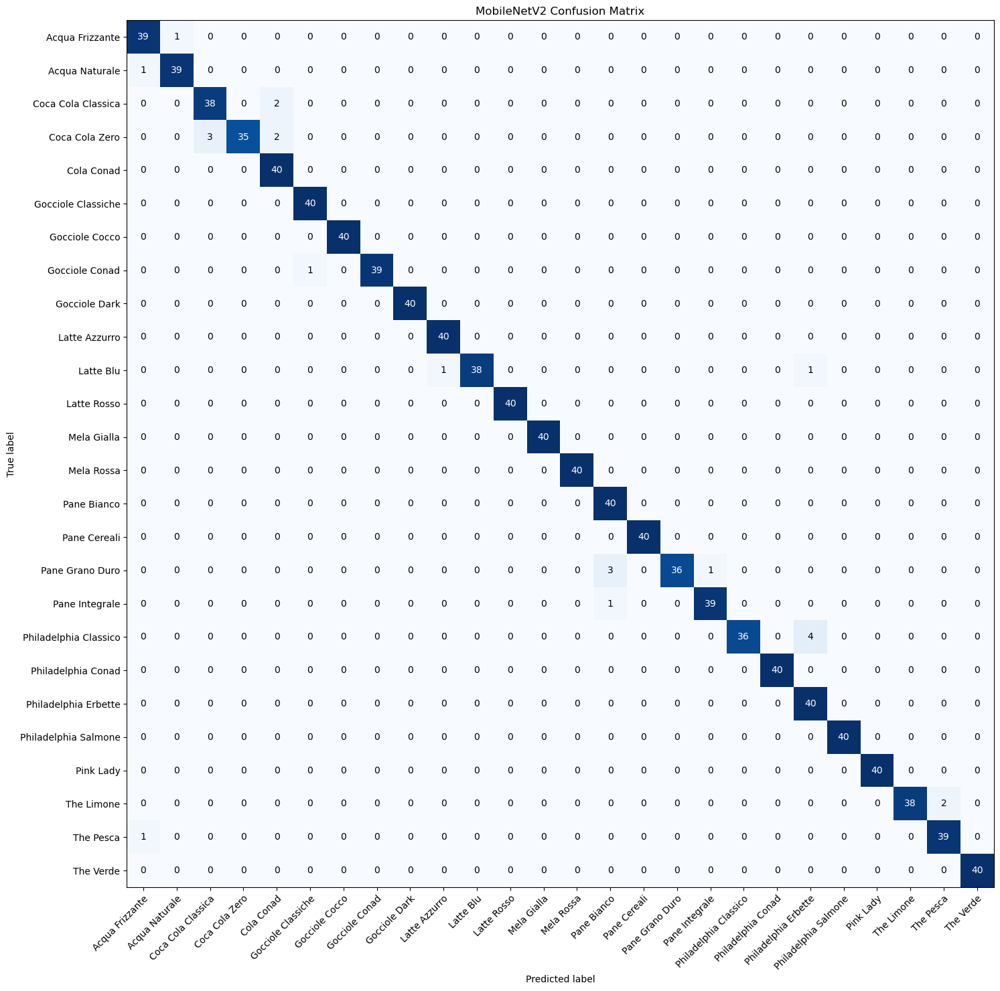

Precision: 0.98
Recall: 0.98
F1-score: 0.98


In [ ]:
def plot_confusion_matrix(y_true, y_pred, class_names, title=None, cmap=plt.cm.Blues, save_path=None):
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(15, 15))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)

    print(y_true)

    ax.set(xticks=np.arange(cm.shape[1]), yticks=np.arange(cm.shape[0]),
           xticklabels=class_names, yticklabels=class_names,
           title=title, ylabel='True label', xlabel='Predicted label')

    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], 'd'), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    fig.tight_layout()

    if save_path:
        plt.savefig(save_path)
        if IN_COLAB:
            files.download(save_path)
        else:
            print(f"Confusion matrix saved locally as {save_path}")

    plt.show()

def printPrecisionRecallF1(y_true, y_pred, class_names):
    precision = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1-score: {f1:.2f}")

def evaluate_model(model, test_batches, class_names, model_name, save_path=None):
    test_loss, test_accuracy = model.evaluate(test_batches)
    print(f"Test Loss {model_name}: {test_loss:.4f}")
    print(f"Test Accuracy {model_name}: {test_accuracy:.4f}")

    # Get true and predicted labels
    y_true = []
    y_pred = []

    for images, labels in test_batches:
        y_true.extend(np.argmax(labels, axis=1))
        predictions = model.predict(images)
        y_pred.extend(np.argmax(predictions, axis=1))

    plot_confusion_matrix(y_true, y_pred, class_names, title=f'{model_name} Confusion Matrix', save_path=save_path)
    printPrecisionRecallF1(y_true, y_pred, class_names)

num_images = 0
for images, labels in test_batches:
    num_images += images.shape[0]

print(f"Numero totale di immagini in test_batches: {num_images}")

for model in models:
    save_path = f"{model.name}_confusion_matrix"+version+".png"
    evaluate_model(model, test_batches, classes_test, model.name, save_path)

## Inference

Predictions for model: MobileNetV2
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


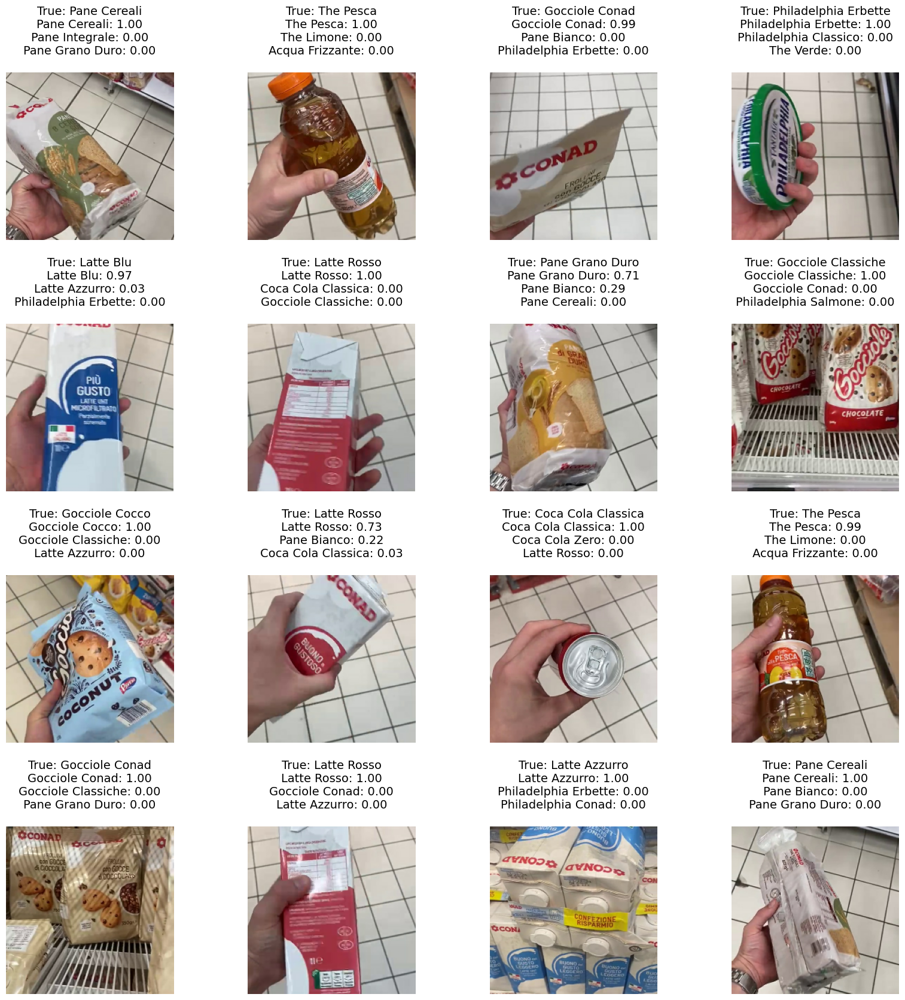

In [ ]:
# Function to show the top predictions for a batch of images
def show_predictions(model, test_batches, class_names, top_k=3):
    # Get a batch of test images and their true labels
    for images, labels in test_batches.take(1):
        batch_size = images.shape[0]  # Dynamically determine the batch size
        predictions = model.predict(images)
        predicted_labels = tf.argsort(predictions, axis=-1, direction='DESCENDING')[:, :top_k]

        plt.figure(figsize=(20, 20))
        for i in range(min(16, batch_size)):
            plt.subplot(4, 4, i + 1)
            plt.imshow((images[i] + 1) / 2)  # Rescaling from [-1, 1] to [0, 1]
            true_label = class_names[tf.argmax(labels[i])]
            top_predicted_labels = [class_names[label] for label in predicted_labels[i]]
            top_confidences = [predictions[i][label] for label in predicted_labels[i]]
            title = f'True: {true_label}\n'
            for j in range(top_k):
                title += f'{top_predicted_labels[j]}: {top_confidences[j]:.2f}\n'
            plt.title(title, fontsize=14)
            plt.axis("off")
        plt.subplots_adjust(hspace=0.5)
        plt.show()

# Run the show_predictions function for each model
for model in models:
    print(f"Predictions for model: {model.name}")
    show_predictions(model, test_batches, classes_test, top_k=3)

## Upload Model

In [ ]:
mobilenetv2_model = tf.keras.models.load_model("MobileNetV2" + '_Train2'+version+'.keras', compile=True)
print(f"{mobilenetv2_model.name} loaded successfully.")
models = [mobilenetv2_model]

MobileNetV2 loaded successfully.


## Convert model to TFLITE

In [ ]:
for model in models:
    try:
        print(f"Converting model: {model.name}"+version)
        converter = tf.lite.TFLiteConverter.from_keras_model(model)
        tflite_model = converter.convert()
        with open(f"{model.name}"+version+".tflite", 'wb') as f:
            f.write(tflite_model)
        print(f"{model.name}"+version+".tflite saved successfully.")
    except Exception as e:
        print(f"Error converting {model.name}"+version+f": {e}")

# Scarica i file .h5 e .tflite se eseguito in Colab
if IN_COLAB:
    for model in models:
        files.download(f"{model.name}"+version+".tflite")
        print(f"{model.name}"+version+".tflite downloaded successfully.")

Converting model: MobileNetV2_FULLDATASET_20_10
INFO:tensorflow:Assets written to: C:\Users\andre\AppData\Local\Temp\tmpqxjzk8a_\assets


INFO:tensorflow:Assets written to: C:\Users\andre\AppData\Local\Temp\tmpqxjzk8a_\assets


Saved artifact at 'C:\Users\andre\AppData\Local\Temp\tmpqxjzk8a_'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_8')
Output Type:
  TensorSpec(shape=(None, 26), dtype=tf.float32, name=None)
Captures:
  2531553579792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531553579408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531233117584: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531553579984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531233112208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531246469968: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531246468624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531461395088: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531246471120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531246470160: TensorSpec(shape=(), dtype=tf.resource, name=None)
  253

In [ ]:
for model in models:
    try:
        print(f"Converting model: {model.name}"+version+"_quantized")
        converter = tf.lite.TFLiteConverter.from_keras_model(model)

        converter.optimizations = [tf.lite.Optimize.DEFAULT]
        converter.target_spec.supported_ops = [
                tf.lite.OpsSet.TFLITE_BUILTINS,
                tf.lite.OpsSet.SELECT_TF_OPS
                ]

        tflite_model = converter.convert()
        with open(f"{model.name}"+version+"_quantized.tflite", 'wb') as f:
            f.write(tflite_model)
        print(f"{model.name}"+version+"_quantized.tflite saved successfully.")
    except Exception as e:
        print(f"Error converting {model.name}"+version+"_quantized"+f": {e}")

# Scarica i file .h5 e .tflite se eseguito in Colab
if IN_COLAB:
    for model in models:
        files.download(f"{model.name}"+version+"_quantized.tflite")
        print(f"{model.name}"+version+"_quantized.tflite downloaded successfully.")

Converting model: MobileNetV2_FULLDATASET_20_10_quantized
INFO:tensorflow:Assets written to: C:\Users\andre\AppData\Local\Temp\tmp_n6ktshl\assets


INFO:tensorflow:Assets written to: C:\Users\andre\AppData\Local\Temp\tmp_n6ktshl\assets


Saved artifact at 'C:\Users\andre\AppData\Local\Temp\tmp_n6ktshl'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_8')
Output Type:
  TensorSpec(shape=(None, 26), dtype=tf.float32, name=None)
Captures:
  2531553579792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531553579408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531233117584: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531553579984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531233112208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531246469968: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531246468624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531461395088: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531246471120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2531246470160: TensorSpec(shape=(), dtype=tf.resource, name=None)
  253

In [ ]:
for model in models:
    with open(f"{model.name}_labels"+version+".txt", 'w') as f:
        for label in classes_train:  # Assuming labels are same for train, val, and test
            f.write(f"{label}\n")
    print(f"{model.name}"+version+"_labels.txt saved successfully.")

if IN_COLAB:
    for model in models:
        files.download(f"{model.name}_labels"+version+".txt")
        print(f"{model.name}"+version+"_labels.txt downloaded successfully.")

MobileNetV2_FULLDATASET_20_10_labels.txt saved successfully.


# Confusion matrix, Precision, Recall, F1-Score on Lite Model

In [ ]:
lite_model = "MobileNetV2"+version
mobilenetv2_interpreter = tf.lite.Interpreter(model_path=lite_model+'.tflite')
print(lite_model+" Interpreter loaded successfully.")
interpreters = [mobilenetv2_interpreter]
lite_models_names = [lite_model]


lite_model_quantized = "MobileNetV2"+version+"_quantized"
mobilenetv2_interpreter_quantized = tf.lite.Interpreter(model_path=lite_model_quantized+'.tflite')
print(lite_model_quantized+" Interpreter loaded successfully.")
interpreters_quantized = [mobilenetv2_interpreter_quantized]
lite_models_names_quantized = [lite_model_quantized]

MobileNetV2_FULLDATASET_20_10 Interpreter loaded successfully.
MobileNetV2_FULLDATASET_20_10_quantized Interpreter loaded successfully.


Confusion matrix saved locally as MobileNetV2_FULLDATASET_20_10_confusion_matrix_lite.png


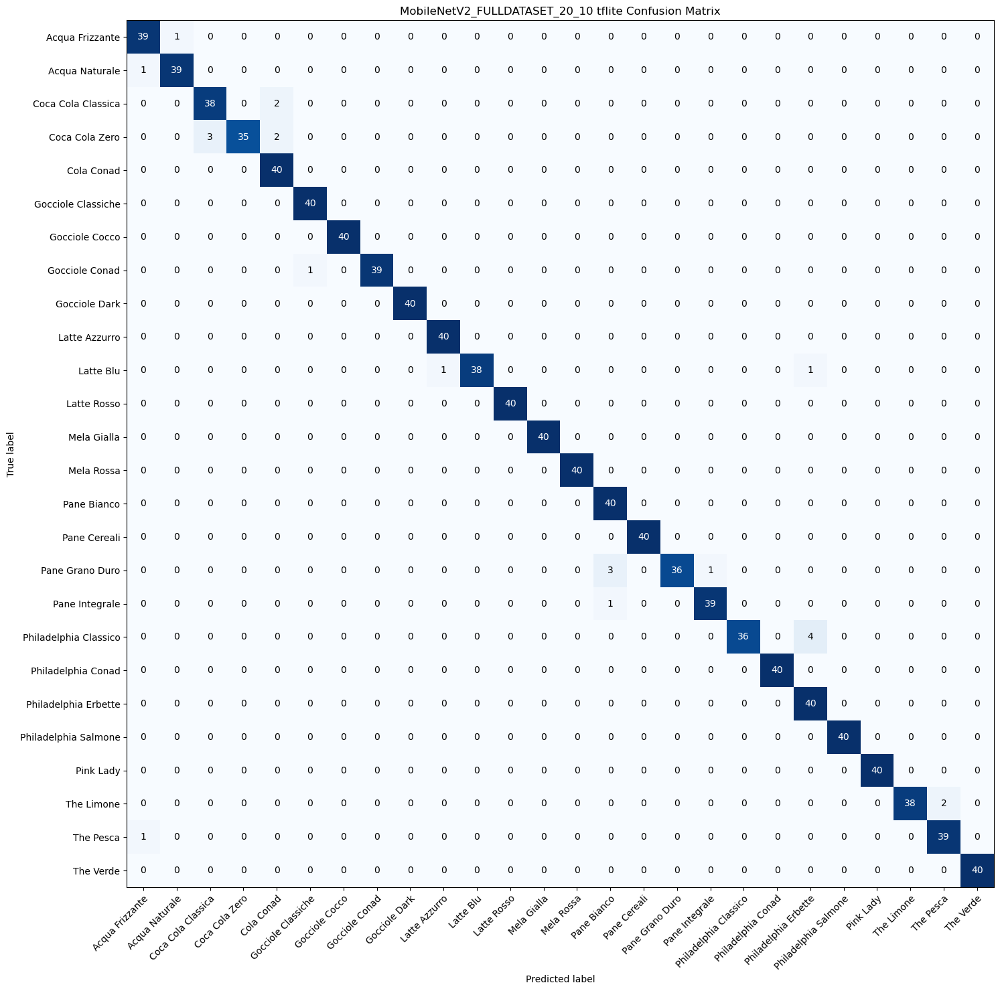

Precision: 0.98
Recall: 0.98
F1-score: 0.98
Confusion matrix saved locally as MobileNetV2_FULLDATASET_20_10_quantized_confusion_matrix_lite.png


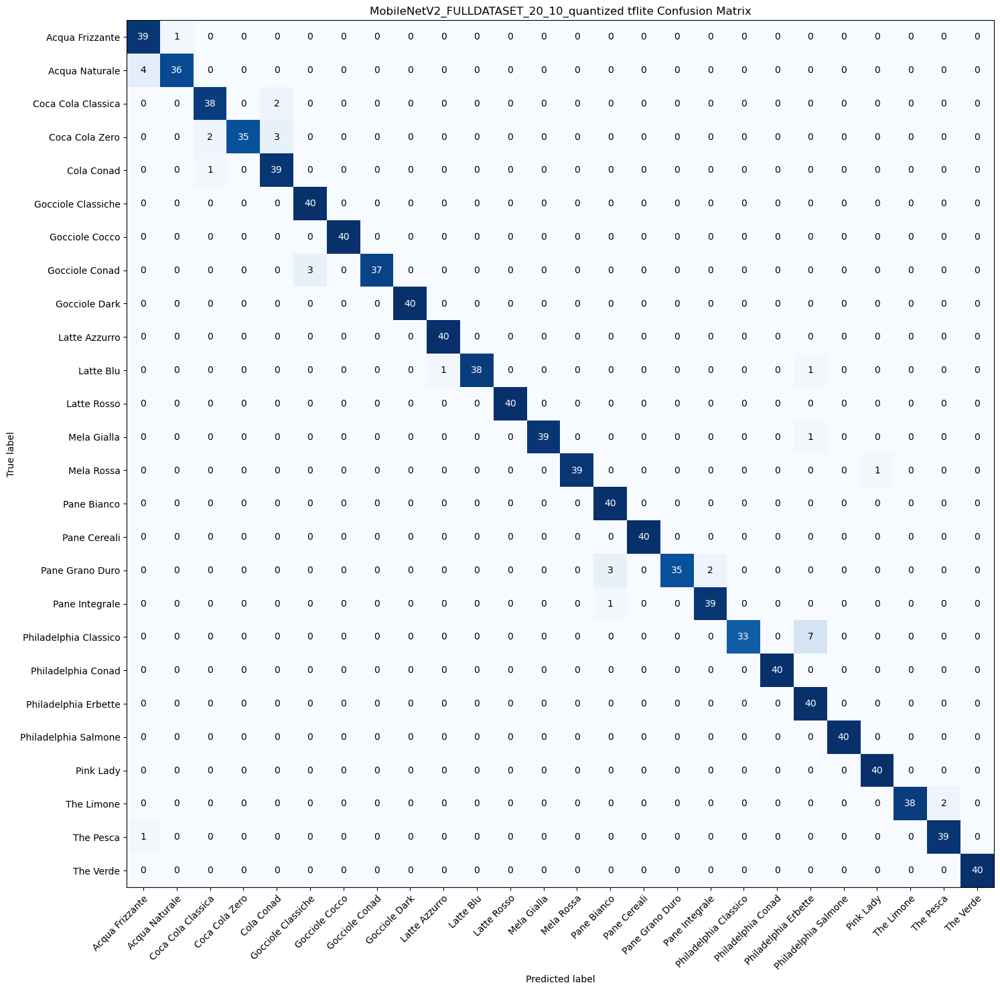

Precision: 0.97
Recall: 0.97
F1-score: 0.97


In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt

def plot_confusion_matrix(y_true, y_pred, class_names, title=None, cmap=plt.cm.Blues, save_path=None):
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(15, 15))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)

    ax.set(xticks=np.arange(cm.shape[1]), yticks=np.arange(cm.shape[0]),
           xticklabels=class_names, yticklabels=class_names,
           title=title, ylabel='True label', xlabel='Predicted label')

    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], 'd'), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    fig.tight_layout()

    if save_path:
        plt.savefig(save_path)
        if IN_COLAB:
            files.download(save_path)
        else:
            print(f"Confusion matrix saved locally as {save_path}")

    plt.show()

def printPrecisionRecallF1(y_true, y_pred, class_names):
    precision = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1-score: {f1:.2f}")

def evaluate_tflite_model(interpreter, test_batches, class_names, model_name, save_path=None):
    # Set the input tensor to the test batch shape
    input_index = interpreter.get_input_details()[0]["index"]
    output_index = interpreter.get_output_details()[0]["index"]

    y_true = []
    y_pred = []

    for images, labels in test_batches:
        y_true.extend(np.argmax(labels, axis=1))

        # Run inference
        interpreter.allocate_tensors()
        for img in images:
            img = np.expand_dims(img, axis=0).astype(np.float32)
            interpreter.set_tensor(input_index, img)
            interpreter.invoke()
            output = interpreter.get_tensor(output_index)
            y_pred.append(np.argmax(output))

    plot_confusion_matrix(y_true, y_pred, class_names, title=f'{model_name} Confusion Matrix', save_path=save_path)
    printPrecisionRecallF1(y_true, y_pred, class_names)


for interpreter,lite_model_name in zip(interpreters,lite_models_names):
  save_path = f"{lite_model_name}_confusion_matrix_lite.png"
  evaluate_tflite_model(interpreter, test_batches, classes_test, model_name=lite_model_name+' tflite', save_path=save_path)


for interpreter_q,lite_model_name_q in zip(interpreters_quantized,lite_models_names_quantized):
  save_path = f"{lite_model_name_q}_confusion_matrix_lite.png"
  evaluate_tflite_model(interpreter_q, test_batches, classes_test, model_name=lite_model_name_q+' tflite', save_path=save_path)

#Inference on Lite Model

In [ ]:
mobilenetv2_interpreter = tf.lite.Interpreter(model_path="MobileNetV2"+version+'.tflite')
print("MobileNetV2"+version+" Interpreter loaded successfully.")
interpreters = [mobilenetv2_interpreter]

MobileNetV2_FULLDATASET_20_10 Interpreter loaded successfully.


Shape of predictions: (16, 26)


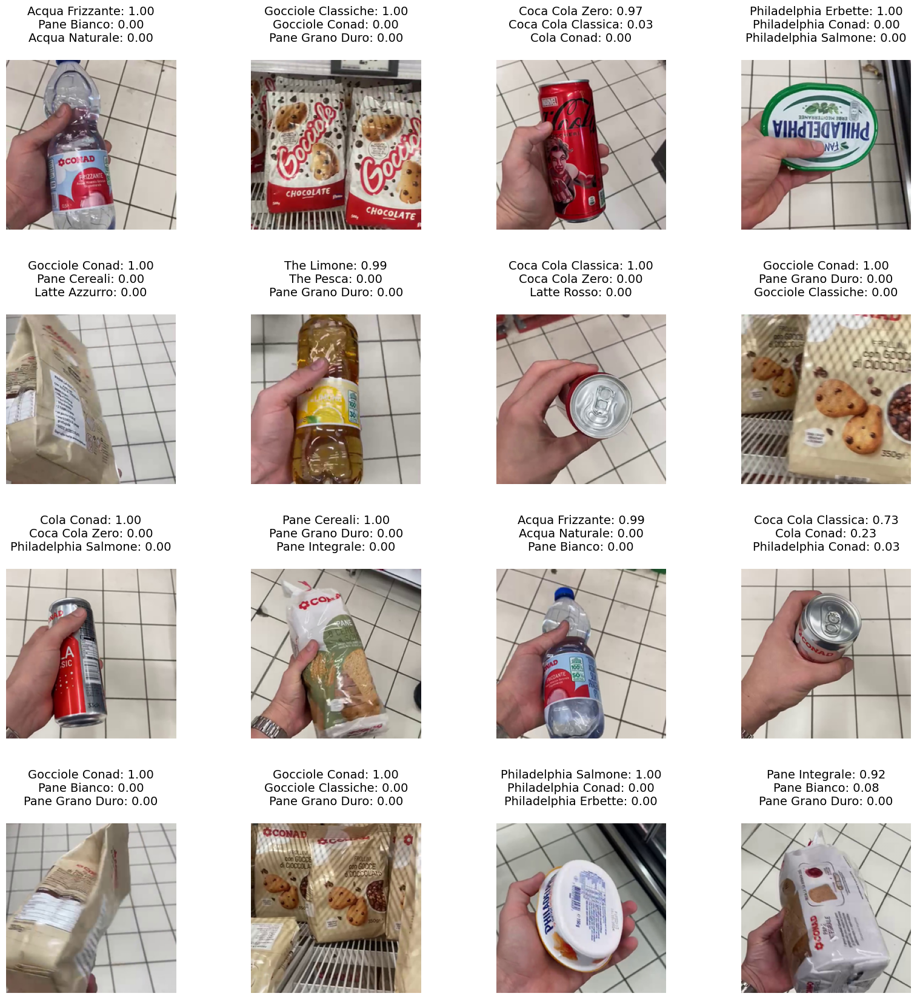

In [ ]:
def center_crop(img, target_size):
    width, height = img.size
    new_width, new_height = target_size
    left = (width - new_width) / 2
    top = (height - new_height) / 2
    right = (width + new_width) / 2
    bottom = (height + new_height) / 2
    return img.crop((left, top, right, bottom))

def preprocess_image_batch(image_paths):
    images = []
    for image_path in image_paths:
        try:
            img = Image.open(image_path)
            img = center_crop(img, crop_size)
            img = img.resize((224, 224), Image.LANCZOS)
            img = np.array(img, dtype=np.float32)
            img = img / 255.0  # Normalizzazione a [0, 1]
            img = (img * 2) - 1  # Standardizzazione a [-1, 1]
            images.append(img)
        except Exception as e:
            print(f"Error processing image {image_path}: {e}")
    return np.array(images)

# Funzione per mostrare le top predizioni
def show_predictions_tflite(interpreter, image_dir, class_names, top_k=3):
    # Preprocessa le immagini
    image_paths = [str(p) for p in Path(image_dir).rglob("*.jpg")]  # Modifica il pattern se necessario per altri formati
    if len(image_paths) == 0:
        print(f"No images found in the directory {image_dir}.")
        return

    image_paths = random.sample(image_paths, min(16, len(image_paths)))

    input_data = preprocess_image_batch(image_paths)
    if input_data.shape[0] == 0:
        print("No images were processed successfully.")
        return

    batch_size = input_data.shape[0]
    predictions = []

    # Esegui l'inferenza su ciascuna immagine
    for i in range(batch_size):
        interpreter.set_tensor(input_details[0]['index'], np.expand_dims(input_data[i], axis=0))
        interpreter.invoke()
        output_data = interpreter.get_tensor(output_details[0]['index'])
        predictions.append(output_data[0])

    predictions = np.array(predictions)
    print(f"Shape of predictions: {predictions.shape}")

    if len(predictions.shape) == 2 and predictions.shape[1] > 1:
        predicted_labels = tf.argsort(predictions, axis=-1, direction='DESCENDING')[:, :top_k]
    else:
        print("Error: Predictions have an unexpected shape. Ensure the model output is correct.")
        return

    # Mostra le immagini con le top predizioni
    plt.figure(figsize=(20, 20))
    for i in range(min(16, batch_size)):
        plt.subplot(4, 4, i + 1)
        plt.imshow((input_data[i] + 1) / 2)  # Rescaling from [-1, 1] to [0, 1]
        top_predicted_labels = [class_names[label] for label in predicted_labels[i]]
        top_confidences = [predictions[i][label] for label in predicted_labels[i]]
        title = ''
        for j in range(top_k):
            title += f'{top_predicted_labels[j]}: {top_confidences[j]:.2f}\n'
        plt.title(title, fontsize=14)
        plt.axis("off")
    plt.subplots_adjust(hspace=0.5)
    plt.show()

for interpreter in interpreters:
        interpreter.allocate_tensors()

        # Ottieni i dettagli dei tensori di input e output
        input_details = interpreter.get_input_details()
        output_details = interpreter.get_output_details()
        show_predictions_tflite(interpreter, test_path, classes_test, top_k=3)

# Grad-CAM class activation visualization


In [ ]:
mobilenetv2_model = tf.keras.models.load_model("MobileNetV2" + '_Train2'+version+'.keras', compile=True)
print(f"{mobilenetv2_model.name} loaded successfully.")
models = [mobilenetv2_model]

MobileNetV2 loaded successfully.


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Grad-Cam saved locally as MobileNetV2_gradCAM_FULLDATASET_30_15.png


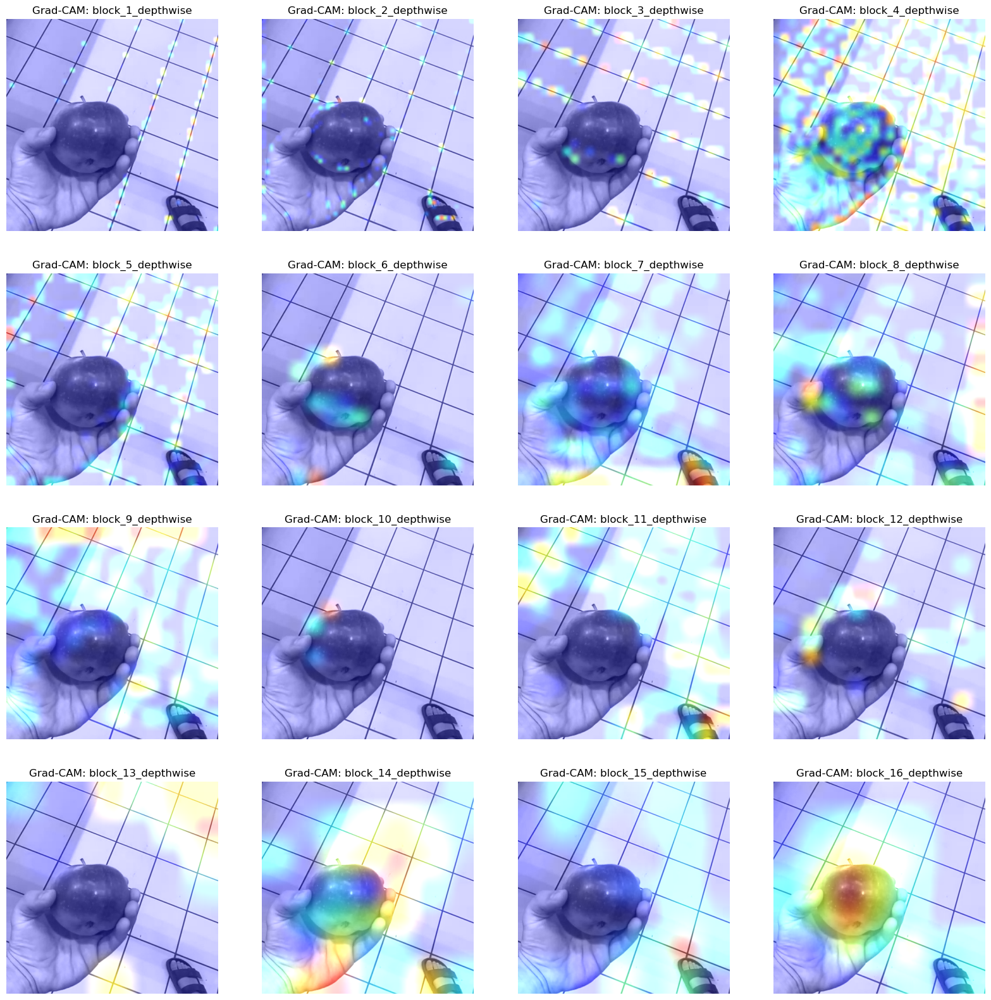

In [ ]:
# Funzione per caricare e preprocessare l'immagine
def load_and_preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Aggiungi la dimensione batch
    img_array = (img_array / 255.0) * 2.0 - 1.0  # Scala da [0, 255] a [-1, 1]
    return img_array

# Funzione per calcolare Grad-CAM
def grad_cam(model, img_array, layer_name, class_idx):
    # Compute Gradients
    grad_model = Model(inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_layer_output, predictions = grad_model(img_array)
        predictions = tf.convert_to_tensor(predictions)
        if IN_COLAB:
            loss = predictions[0, 0, class_idx]
        else:
            loss = predictions[:, class_idx]
    grads = tape.gradient(loss, conv_layer_output)
    # Compute Pooled Grads
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    # Generate Heatmap
    heatmap = tf.tensordot(conv_layer_output[0], pooled_grads, axes=([-1], [0]))
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap) #Normalizzazione valori a [0,1]

    return heatmap

# Funzione per sovrapporre il heatmap all'immagine
def overlay_heatmap(img_path, heatmap, alpha=0.6, colormap='jet', RGB=False):
    if RGB:
        img = Image.open(img_path).convert('RGB')
    else:
        img = Image.open(img_path).convert('L')
        img = np.stack([img] * 3, axis=-1)  # Stack along the last dimension to create RGB channels

    img = np.array(img)

    heatmap = np.uint8(255 * heatmap)

    colormap = plt.get_cmap(colormap)
    heatmap = colormap(heatmap)[:, :, :3]
    heatmap = (heatmap * 255).astype(np.uint8)

    heatmap = Image.fromarray(heatmap)
    heatmap = heatmap.resize((img.shape[1], img.shape[0]))
    heatmap = np.array(heatmap)

    overlayed_img = heatmap * alpha + img
    overlayed_img = np.clip(overlayed_img, 0, 255).astype("uint8")
    overlayed_img = Image.fromarray(overlayed_img)

    return overlayed_img

# Visualizza l'immagine con il heatmap
def display_gradcam(img_path, heatmaps, layer_names, grid_cols=4, save_path=None):
    num_heatmaps = len(heatmaps)
    grid_rows = (num_heatmaps + grid_cols - 1) // grid_cols  # Numero di righe necessario

    plt.figure(figsize=(20, 20))
    for i in range(num_heatmaps):
        plt.subplot(grid_rows, grid_cols, i + 1)
        overlay_img = overlay_heatmap(img_path, heatmaps[i])
        plt.imshow(overlay_img)
        plt.title(f'Grad-CAM: {layer_names[i]}')
        plt.axis('off')

    if save_path:
        plt.savefig(save_path)
        if IN_COLAB:
            files.download(save_path)
        else:
            print(f"Grad-Cam saved locally as {save_path}")

    plt.show()

for model in models:
    if IN_COLAB:
      img_path = "/content/drive/MyDrive/datasetCustom/MelaRossa.jpg"
    else:
      img_path = "C:/Users/andre/Desktop/ProgettoSistemiDigitali/datasetCustom/MelaRossa.jpg"

    # Carica e preprocessa l'immagine
    img_array = load_and_preprocess_image(img_path)

    # Ottieni le predizioni
    predictions = model.predict(img_array)
    class_idx = np.argmax(predictions[0])

    # Calcola il heatmap di Grad-CAM per ogni layer "depthwise"
    heatmaps = []
    layer_names = []

    for layer in model.layers:
        if re.match(r"^block_\d+_depthwise$", layer.name):
            heatmap = grad_cam(model, img_array, layer.name, class_idx)
            heatmaps.append(heatmap)
            layer_names.append(layer.name)

    # Visualizza Grad-CAM
    save_path = f"{model.name}_gradCAM"+version+".png"
    display_gradcam(img_path, heatmaps, layer_names, save_path=save_path)